<a href="https://colab.research.google.com/github/Kaiizx/Diabetic-Retinopathy/blob/main/Diabetic_Retinopathy_efb5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Mon Feb 27 02:28:09 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    25W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install -q kaggle

In [ ]:
!pip install -U --pre efficientnet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 KB 2.6 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp /content/drive/MyDrive/colab/kaggle.json /content/kaggle.json

In [ ]:
!mkdir ~/.kaggle
!cp /content/kaggle.json ~/.kaggle/ 
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets list
!kaggle competitions download -c diabetic-retinopathy-classification-for-superai-3 

ref                                                                title                                            size  lastUpdated          downloadCount  voteCount  usabilityRating  
-----------------------------------------------------------------  ----------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
themrityunjaypathak/covid-cases-and-deaths-worldwide               Covid Cases and Deaths WorldWide                  8KB  2023-02-01 12:22:51           6324        190  1.0              
amaanansari09/top-100-songs                                        Top 100 songs                                     6KB  2023-02-16 18:55:35            937         35  1.0              
datascientistanna/customers-dataset                                Shop Customer Data                               23KB  2023-02-07 18:42:21           4903        122  1.0              
thedevastator/airbnb-prices-in-european-cities                   

In [ ]:
!unzip /content/diabetic-retinopathy-classification-for-superai-3.zip

Streaming output truncated to the last 5000 lines.
  inflating: Test/Test/Test_288.jpg  
  inflating: Test/Test/Test_289.jpg  
  inflating: Test/Test/Test_29.jpg   
  inflating: Test/Test/Test_290.jpg  
  inflating: Test/Test/Test_291.jpg  
  inflating: Test/Test/Test_292.jpg  
  inflating: Test/Test/Test_293.jpg  
  inflating: Test/Test/Test_294.jpg  
  inflating: Test/Test/Test_295.jpg  
  inflating: Test/Test/Test_296.jpg  
  inflating: Test/Test/Test_297.jpg  
  inflating: Test/Test/Test_298.jpg  
  inflating: Test/Test/Test_299.jpg  
  inflating: Test/Test/Test_3.jpg    
  inflating: Test/Test/Test_30.jpg   
  inflating: Test/Test/Test_300.jpg  
  inflating: Test/Test/Test_301.jpg  
  inflating: Test/Test/Test_302.jpg  
  inflating: Test/Test/Test_303.jpg  
  inflating: Test/Test/Test_304.jpg  
  inflating: Test/Test/Test_305.jpg  
  inflating: Test/Test/Test_306.jpg  
  inflating: Test/Test/Test_307.jpg  
  inflating: Test/Test/Test_308.jpg  
  inflating: Test/Test/Test_309.jpg  

##Import lib


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import PIL.Image
import cv2
from os import listdir
import albumentations as A
from google.colab.patches import cv2_imshow


In [ ]:
import os
import tensorflow as tf
from tensorflow import keras
from keras.layers import Input, Conv2D
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

In [ ]:
from efficientnet.keras import EfficientNetB5

##Map class

In [ ]:
data_class = pd.read_csv("/content/Train.csv")
data_class

,id_code,diagnosis
0,Train_1,2
1,Train_2,2
2,Train_3,4
3,Train_4,2
4,Train_5,3
...,...,...
4204,Train_4205,2
4205,Train_4206,2
4206,Train_4207,2
4207,Train_4208,0


In [ ]:
data_class["id_code"] = '/content/Train/Train/'+data_class["id_code"]+'.jpg'
data_class

,id_code,diagnosis
0,/content/Train/Train/Train_1.jpg,2
1,/content/Train/Train/Train_2.jpg,2
2,/content/Train/Train/Train_3.jpg,4
3,/content/Train/Train/Train_4.jpg,2
4,/content/Train/Train/Train_5.jpg,3
...,...,...
4204,/content/Train/Train/Train_4205.jpg,2
4205,/content/Train/Train/Train_4206.jpg,2
4206,/content/Train/Train/Train_4207.jpg,2
4207,/content/Train/Train/Train_4208.jpg,0


## Preprocessing

In [ ]:
# Specify image size
IMG_WIDTH = 456
IMG_HEIGHT = 456
CHANNELS = 3

In [ ]:
##https://www.kaggle.com/code/ratthachat/aptos-eye-preprocessing-in-diabetic-retinopathy?scriptVersionId=20340219&cellId=16

def crop_image_from_gray(img, tol=7):
    """
    Applies masks to the orignal image and 
    returns the a preprocessed image with 
    3 channels
    
    :param img: A NumPy Array that will be cropped
    :param tol: The tolerance used for masking
    
    :return: A NumPy array containing the cropped image
    """
    # If for some reason we only have two channels
    if img.ndim == 2:
        mask = img > tol
        return img[np.ix_(mask.any(1),mask.any(0))]
    # If we have a normal RGB images
    elif img.ndim == 3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img > tol
        
        check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
        if (check_shape == 0): # image is too dark so that we crop out everything,
            return img # return original image
        else:
            img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
            img = np.stack([img1,img2,img3],axis=-1)
        return img

def preprocess_image(image, sigmaX=10):

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = crop_image_from_gray(image)
    image = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT))
    image = cv2.addWeighted (image,4, cv2.GaussianBlur(image, (0,0) ,sigmaX), -4, 128)
    return image

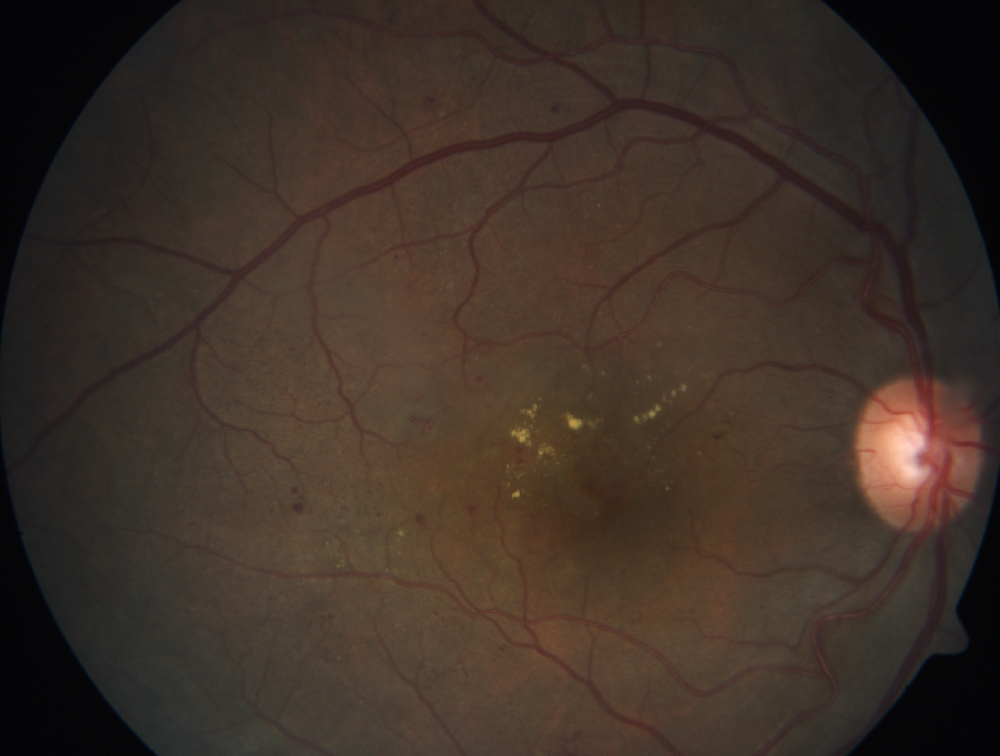

In [ ]:
img = cv2.imread("/content/Train/Train/Train_4203.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(img)

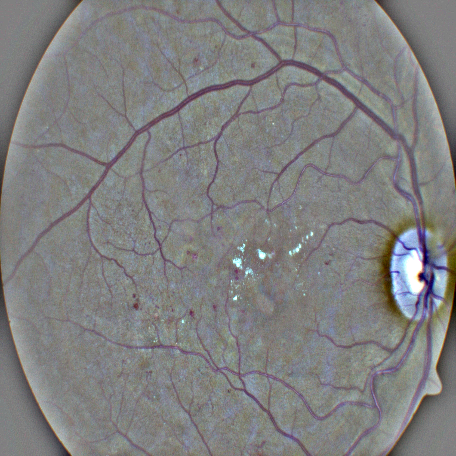

In [ ]:
cv2_imshow(preprocess_image(img))

## EDA

In [ ]:
d2 = data_class[(data_class['id_code']=="/content/Train/Train/Train_4203.jpg")]
d2

,id_code,diagnosis
4202,/content/Train/Train/Train_4203.jpg,2


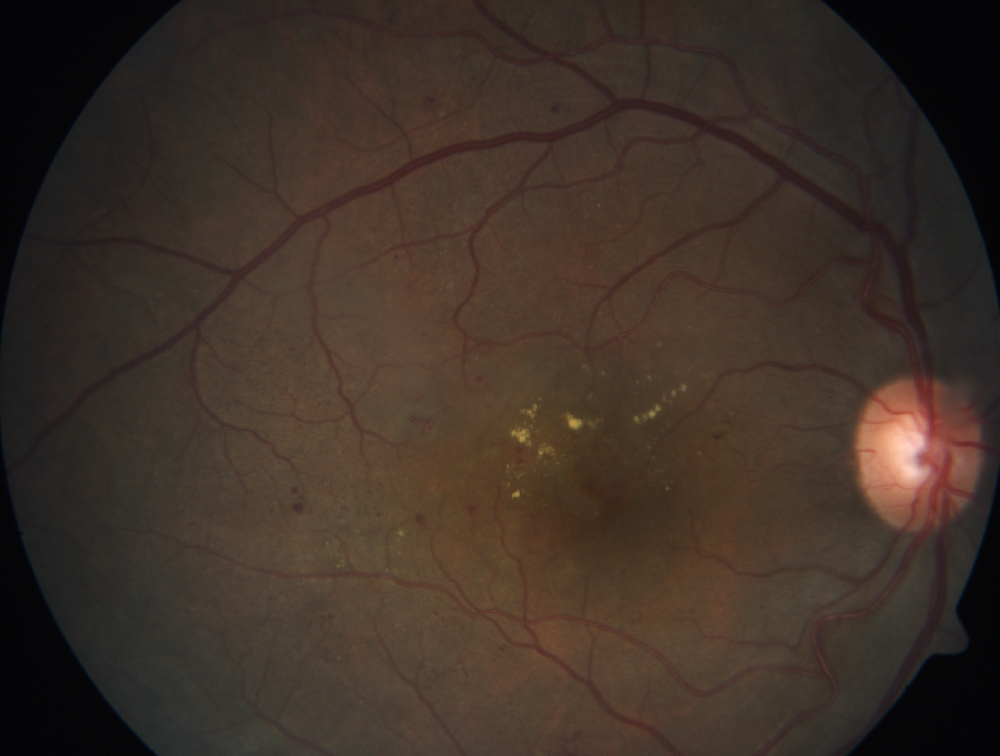

In [ ]:
img = cv2.imread("/content/Train/Train/Train_4203.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(img)

In [ ]:
img.shape


(1958, 2588, 3)

In [ ]:
print('0 :'+str(len(data_class[data_class['diagnosis']==0])))
print('1 :'+str(len(data_class[data_class['diagnosis']==1])))
print('2 :'+str(len(data_class[data_class['diagnosis']==2])))
print('3 :'+str(len(data_class[data_class['diagnosis']==3])))
print('4 :'+str(len(data_class[data_class['diagnosis']==4])))

0 :1948
1 :420
2 :1051
3 :473
4 :317


array([[<AxesSubplot:title={'center':'diagnosis'}>]], dtype=object)

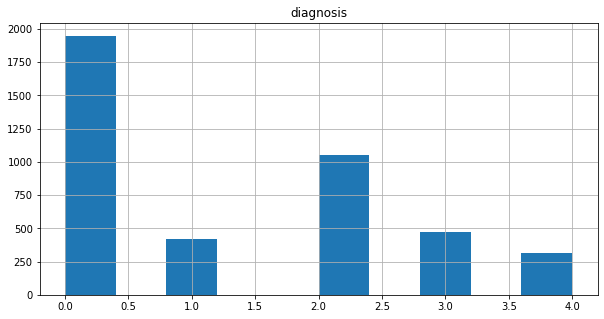

In [ ]:
data_class[['diagnosis']].hist(figsize = (10, 5))

In [ ]:
data_class['diagnosis'] = data_class['diagnosis'].astype(str)
data_class.dtypes

id_code      object
diagnosis    object
dtype: object

In [ ]:
count_df = data_class.groupby(list(data_class.diagnosis)).size().reset_index(name='count')
count_df

,index,count
0,0,1948
1,1,420
2,2,1051
3,3,473
4,4,317


In [ ]:
new_dataset = listdir("/content/Train/Train/")
len(new_dataset)

4209

## Preprocessing

In [ ]:
# We use a small batch size so we can handle large images easily
BATCH_SIZE = 4
TRAIN_IMG_PATH = '/content/Train/Train/'

# Add Image augmentation to our generator
train_datagen = ImageDataGenerator(rotation_range=360,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   validation_split=0.15,
                                   preprocessing_function=preprocess_image, 
                                   rescale=1 / 128.)

# Use the dataframe to define train and validation generators
train_generator = train_datagen.flow_from_dataframe(data_class, 
                                                    x_col='id_code', 
                                                    y_col='diagnosis',
                                                    directory = TRAIN_IMG_PATH,
                                                    target_size=(IMG_WIDTH, IMG_HEIGHT),
                                                    batch_size=BATCH_SIZE,
                                                    class_mode='other', 
                                                    subset='training')

val_generator = train_datagen.flow_from_dataframe(data_class, 
                                                  x_col='id_code', 
                                                  y_col='diagnosis',
                                                  directory = TRAIN_IMG_PATH,
                                                  target_size=(IMG_WIDTH, IMG_HEIGHT),
                                                  batch_size=BATCH_SIZE,
                                                  class_mode='other',
                                                  subset='validation')

Found 3578 validated image filenames.
Found 631 validated image filenames.


In [ ]:
train_generator.image_shape

(456, 456, 3)

##Model (Transfer learning) efficientnet-b5


In [ ]:
!unzip /content/drive/MyDrive/colab/model/efficientnet-b5_imagenet_1000_notop.h5.zip

Archive:  /content/drive/MyDrive/colab/model/efficientnet-b5_imagenet_1000_notop.h5.zip
  inflating: efficientnet-b5_imagenet_1000_notop.h5  


In [ ]:
effnet = EfficientNetB5(weights=None,
                        include_top=False,
                        input_shape=(IMG_WIDTH, IMG_HEIGHT, 3))

In [ ]:
# Repository source: https://github.com/qubvel/efficientnet
effnet.load_weights('/content/efficientnet-b5_imagenet_1000_notop.h5')

In [ ]:
from keras.models import Sequential
from keras.layers import Activation, Dropout, Dense, GlobalAveragePooling2D
from keras.optimizers import RMSprop
from keras.activations import elu
from keras.callbacks import Callback,EarlyStopping,ReduceLROnPlateau
from sklearn.metrics import cohen_kappa_score

In [ ]:
def build_model():
    model = Sequential()
    model.add(effnet)
    model.add(GlobalAveragePooling2D())
    model.add(Dropout(0.5))
    model.add(Dense(5, activation=elu))
    model.add(Dense(1, activation="linear"))
    model.compile(loss='mse',
                  optimizer=tf.keras.optimizers.Adam(learning_rate=0.00005),
                  metrics=['mse', 'acc'])
    print(model.summary())
    return model

# Initialize model
model = build_model()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnet-b5 (Functional  (None, 15, 15, 2048)     28513520  
 )                                                               
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 5)                 10245     
                                                                 
 dense_1 (Dense)             (None, 1)                 6         
                                                                 
Total params: 28,523,771
Trainable params: 28,351,035
No

## QuadraticWeightedKappa

In [ ]:
def get_preds_and_labels(model, generator):
    preds = []
    labels = []
    for _ in range(int(np.ceil(generator.samples / BATCH_SIZE))):
        x, y = next(generator)
        preds.append(model.predict(x))
        labels.append(y)
    # Flatten list of numpy arrays
    return np.concatenate(preds).ravel(), np.concatenate(labels).ravel()

In [ ]:
SAVED_MODEL_NAME = '/content/drive/MyDrive/colab/model/efb5.h5'

In [ ]:
class Metrics(Callback):
    """
    A custom Keras callback for saving the best model
    according to the Quadratic Weighted Kappa (QWK) metric
    """
    def on_train_begin(self, logs={}):
        self.val_kappas = []

    def on_epoch_end(self, epoch, logs={}):
        # Get predictions and convert to integers
        y_pred, labels = get_preds_and_labels(model, val_generator)
        y_pred = np.rint(y_pred).astype(np.uint8).clip(0, 4)
        # We can use sklearns implementation of QWK straight out of the box
        # as long as we specify weights as 'quadratic'
        _val_kappa = cohen_kappa_score(labels, y_pred, weights='quadratic')
        self.val_kappas.append(_val_kappa)
        print(f"val_kappa: {round(_val_kappa, 4)}")
        if _val_kappa == max(self.val_kappas):
            print("Validation Kappa has improved. Saving model.")
            self.model.save(SAVED_MODEL_NAME)
        return

In [ ]:
# For tracking Quadratic Weighted Kappa score
kappa_metrics = Metrics()
# Monitor MSE to avoid overfitting and save best model
es = EarlyStopping(monitor='val_loss', mode='auto', verbose=1, patience=12)
rlr = ReduceLROnPlateau(monitor='val_loss', 
                        factor=0.5, 
                        patience=4, 
                        verbose=1, 
                        mode='auto', 
                        epsilon=0.0001)

In [ ]:
model.fit_generator(train_generator,
                    steps_per_epoch=train_generator.samples // BATCH_SIZE,
                    epochs=35,
                    validation_data=val_generator,
                    validation_steps = val_generator.samples // BATCH_SIZE,
                    callbacks=[kappa_metrics, es, rlr])

## Visaul && Evaluation

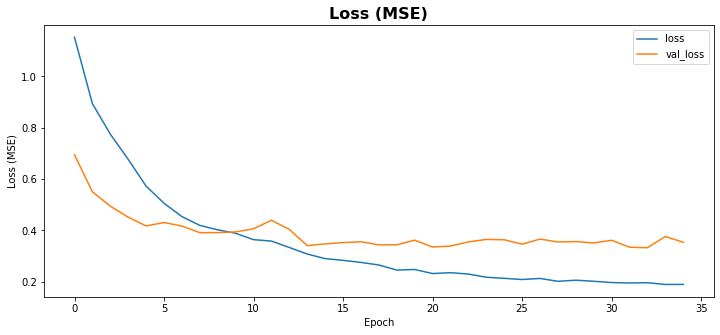

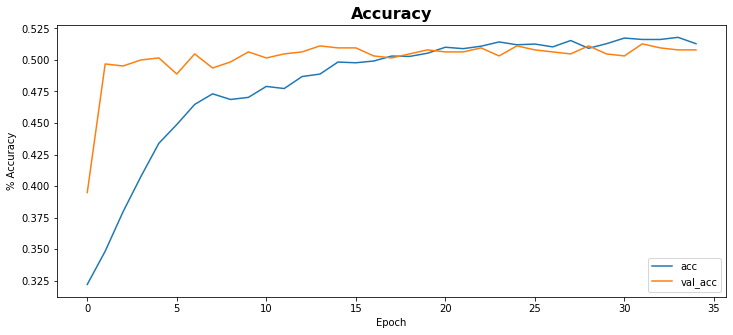

In [ ]:
# Visualize mse
history_df = pd.DataFrame(model.history.history)
history_df[['loss', 'val_loss']].plot(figsize=(12,5))
plt.title("Loss (MSE)", fontsize=16, weight='bold')
plt.xlabel("Epoch")
plt.ylabel("Loss (MSE)")
history_df[['acc', 'val_acc']].plot(figsize=(12,5))
plt.title("Accuracy", fontsize=16, weight='bold')
plt.xlabel("Epoch")
plt.ylabel("% Accuracy");

In [ ]:
from keras.models import load_model

In [ ]:
# Load best weights according to MSE
new_model = model.load_model(SAVED_MODEL_NAME)

In [ ]:
model.load_weights(SAVED_MODEL_NAME)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnet-b5 (Functional  (None, 15, 15, 2048)     28513520  
 )                                                               
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 5)                 10245     
                                                                 
 dense_1 (Dense)             (None, 1)                 6         
                                                                 
Total params: 28,523,771
Trainable params: 28,351,035
No

## Optimized model

In [ ]:
class OptimizedRounder(object):
    def __init__(self):
        self.coef_ = 0
    def predict(self, X, coef):
        X_p = np.copy(X)
        for i, pred in enumerate(X_p):
            if pred < coef[0]:
                X_p[i] = 0
            elif pred >= coef[0] and pred < coef[1]:
                X_p[i] = 1
            elif pred >= coef[1] and pred < coef[2]:
                X_p[i] = 2
            elif pred >= coef[2] and pred < coef[3]:
                X_p[i] = 3
            else:
                X_p[i] = 4
        return X_p

    def coefficients(self):
        return self.coef_['x']

## Prediction

In [ ]:
test_path = '/content/Test/Test/'


In [ ]:
data_test = pd.read_csv("/content/Test.csv")
data_test["id_code"] = '/content/Test/Test/'+data_test["id_code"]+'.jpg'
data_test

,id_code,diagnosis
0,/content/Test/Test/Test_1.jpg,NaN
1,/content/Test/Test/Test_2.jpg,NaN
2,/content/Test/Test/Test_3.jpg,NaN
3,/content/Test/Test/Test_4.jpg,NaN
4,/content/Test/Test/Test_5.jpg,NaN
...,...,...
1963,/content/Test/Test/Test_1964.jpg,NaN
1964,/content/Test/Test/Test_1965.jpg,NaN
1965,/content/Test/Test/Test_1966.jpg,NaN
1966,/content/Test/Test/Test_1967.jpg,NaN


In [ ]:
# For preprocessing test images
test_generator = ImageDataGenerator(preprocessing_function=preprocess_image, 
                                    rescale=1 / 128.).flow_from_dataframe(data_test, 
                                                                          x_col='id_code', 
                                                                          y_col='diagnosis',
                                                                          directory='/content/Test/Test/',
                                                                          target_size=(IMG_WIDTH, IMG_HEIGHT),
                                                                          batch_size=BATCH_SIZE,
                                                                          class_mode='other',
                                                                          shuffle=False)

Found 1968 validated image filenames.


In [ ]:
y_val_preds, val_labels = get_preds_and_labels(model, val_generator)
optR = OptimizedRounder()
optR.fit(y_val_preds, val_labels)
coefficients = optR.coefficients()
opt_val_predictions = optR.predict(y_val_preds, coefficients)
new_val_score = cohen_kappa_score(val_labels, opt_val_predictions, weights="quadratic")

In [ ]:
optR = OptimizedRounder()
coefficients=[0.54672852,1.54995117,2.56860352,2.94492187] #use form referance because have no time
y_test, _ = get_preds_and_labels(model, test_generator)
y_test = optR.predict(y_test, coefficients).astype(np.uint8)

1/1 [==============================] - 0s 50ms/step


In [ ]:
y_test

array([1, 2, 1, ..., 3, 0, 2], dtype=uint8)

In [ ]:
y_test = list(y_test)
y_test

[1,
 2,
 1,
 0,
 4,
 1,
 2,
 0,
 0,
 0,
 0,
 2,
 3,
 2,
 2,
 2,
 0,
 0,
 0,
 3,
 0,
 2,
 0,
 1,
 2,
 2,
 2,
 4,
 0,
 2,
 2,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 4,
 0,
 3,
 4,
 0,
 2,
 0,
 0,
 2,
 4,
 2,
 2,
 0,
 0,
 0,
 2,
 3,
 1,
 1,
 2,
 1,
 0,
 0,
 2,
 4,
 0,
 0,
 2,
 0,
 4,
 0,
 0,
 0,
 3,
 0,
 2,
 0,
 2,
 0,
 2,
 2,
 0,
 2,
 1,
 4,
 2,
 0,
 1,
 2,
 0,
 4,
 4,
 1,
 0,
 0,
 2,
 0,
 0,
 0,
 0,
 2,
 0,
 1,
 2,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 2,
 2,
 1,
 4,
 3,
 3,
 0,
 3,
 0,
 0,
 0,
 0,
 0,
 2,
 2,
 0,
 0,
 0,
 3,
 2,
 1,
 0,
 0,
 0,
 2,
 2,
 2,
 0,
 0,
 2,
 4,
 0,
 1,
 2,
 1,
 0,
 2,
 0,
 0,
 2,
 1,
 0,
 1,
 2,
 0,
 0,
 2,
 0,
 4,
 0,
 2,
 0,
 0,
 0,
 0,
 0,
 0,
 2,
 2,
 0,
 2,
 4,
 0,
 0,
 2,
 0,
 0,
 1,
 0,
 1,
 0,
 3,
 1,
 1,
 0,
 2,
 0,
 0,
 0,
 1,
 2,
 2,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 2,
 0,
 0,
 0,
 4,
 0,
 2,
 2,
 2,
 0,
 2,
 0,
 1,
 1,
 0,
 2,
 0,
 0,
 4,
 0,
 1,
 4,
 2,
 2,
 4,
 1,
 2,
 2,
 0,
 3,
 4,
 0,
 0,
 0,
 0,
 0,
 0,
 4,
 0,
 3,
 1,
 1,
 2,
 0,
 2,
 3,
 2,
 3,


In [ ]:
submit_test = pd.read_csv("/content/Test.csv")
submit_test

,id_code,diagnosis
0,Test_1,NaN
1,Test_2,NaN
2,Test_3,NaN
3,Test_4,NaN
4,Test_5,NaN
...,...,...
1963,Test_1964,NaN
1964,Test_1965,NaN
1965,Test_1966,NaN
1966,Test_1967,NaN


In [ ]:
submit_test['diagnosis']=y_test
submit_test

,id_code,diagnosis
0,Test_1,1
1,Test_2,2
2,Test_3,1
3,Test_4,0
4,Test_5,4
...,...,...
1963,Test_1964,1
1964,Test_1965,0
1965,Test_1966,3
1966,Test_1967,0


In [ ]:
submit_test.to_csv('/content/submit4.csv',index=False)

In [ ]:
!cp /content/submit4.csv /content/drive/MyDrive/colab/submit4.csv

In [ ]:
!kaggle competitions submit -c diabetic-retinopathy-classification-for-superai-3 -f /content/submit4.csv -m "efficientnetb5"

100% 22.0k/22.0k [00:02<00:00, 9.20kB/s]
Successfully submitted to Diabetic Retinopathy Classification for SuperAI 3